# Modelo de RNA com dados de potência elétrica
___

Requisitos:
* Erro Percentual Absoluto Máximo menor que 10%
* Erro Percentual Absoluto Médio menor que 3%

**Disciplina:** Automação Inteligênte

**Autor:** Miguel Marques Ferreira

**GitHub:** https://github.com/Miguel-mmf

## Bibliotecas

In [1]:
!pip install keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 4.7 MB/s eta 0:00:00


In [109]:
!pip install --upgrade pandas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 52.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 346.6/346.6 kB 44.9 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling pandas-1.5.3:
      Successfully uninstalled pandas-1.5.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.
bigframes 0.20.0 requires pandas<2.1.4,>=1.5.0, but you have pandas 2.2.0 which is incompatible.
google-colab 1.0.0 requires pandas==1.5.3, but you have pandas 2.2.0 which is incompatible.


In [110]:
import pandas as pd
import numpy as np
import tensorflow as tf
from datetime import datetime
import matplotlib.pyplot as plt
from matplotlib import rcParams
plt.style.use('default')
rcParams.update(
    {
        'figure.figsize':(16,5),
        'figure.facecolor':'white',
        'font.size':'12',
        'axes.grid': True,
        'axes.grid.axis': 'both',
        # 'text.usetex' : True,
        # 'font.family' : 'serif',
        # 'font.serif' : 'cm'
    }
)

from sklearn.preprocessing import MinMaxScaler
from distutils.dir_util import mkpath
from sklearn.metrics import (
    mean_absolute_error,
    mean_absolute_percentage_error,
    mean_squared_error,
    max_error
)
from sklearn.model_selection import train_test_split
from kerastuner import Objective
from kerastuner.tuners import RandomSearch

%matplotlib inline

## Funções de apoio

In [3]:
def scale_data(df, scalers=None, scaler_type='minmax'):
    """
    Scales a dataset using either MinMaxScaler, StandardScaler or QuantileTransformer from scikit-learn.

    Parameters:
    df (pandas.DataFrame): The dataset to be scaled.
    scaler_type (str): The type of scaler to use. Either 'minmax', 'standard' or 'quantile'.

    Test:
    for s in scalers.values():
        print(s.get_params(True), end=' | ')
        print(s.data_min_, end=' | ')
        print(s.data_max_)

    Returns:
    pandas.DataFrame: The scaled dataset.
    dict: A scalers dict.
    """

    df_norm = pd.DataFrame()

    if scalers:

        for col in df.columns:
            feat = np.array(df[col])
            aux = feat.shape
            data = scalers[col].transform(feat.reshape(-1,1)) # f.transform(feat)
            df_norm[col] = data.reshape(aux)

        return df_norm

    else: # shift nas linhas abaixo

        scalers = dict()
        for col in df.columns:

            if scaler_type == 'minmax':
                scaler = MinMaxScaler(feature_range=(0.15,0.85)) # default
            # elif scaler_type == 'standard':
            #     scaler = StandardScaler()
            # elif scaler_type == 'quantile':
            #     scaler = QuantileTransformer()
            else:
                raise ValueError("Invalid scaler type. Must be 'minmax', 'standard' or 'quantile'.")

            scalers[col] = scaler
            feat = np.array(df[col])
            aux = feat.shape
            data = scalers[col].fit_transform(feat.reshape(-1,1)) # f.transform(feat)
            df_norm[col] = data.reshape(aux)

        return df_norm, scalers

In [4]:
def difference_plot(
        real_data,
        predicted_data,
        xy_labels={
            'x': 'Pontos',
            'y': 'Potência (MW)'
        },
        legends={
            'ax0': ['Potência Real','Potência Estimada'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
        filename=' ',
        save=False,
        formats=['eps', 'png', 'pdf'],
        return_fig=False
    ):
    """This function creates a figure with two subplots: the first one shows the real and predicted data, and the second one shows the difference between the real and predicted data.

    Args:
        real_data (Series): A series with the real data.
        predicted_data (Series): A series with the predicted data.
        xy_labels (dict, optional): _description_. Defaults to { 'x': 'Pontos', 'y': 'Potência (MW)' }.
        legends (dict, optional): _description_. Defaults to { 'ax0': ['Potência Real','Potência Estimada'], 'ax1': ['Diferença entre Potência Real e Estimada'] }.
        filename (str, optional): _description_. Defaults to ' '.
        save (bool, optional): _description_. Defaults to False.
        formats (list, optional): _description_. Defaults to ['eps', 'png', 'pdf'].
        return_fig (bool, optional): _description_. Defaults to False.

    Returns:
        matplotlib.figure.Figure: A figure with two subplots.
    """

    fig, axs = plt.subplots(2, 1, figsize=(12, 8), dpi=600, sharex=True)

    axs[0].plot(real_data, lw=2, color='Red', marker='s', markersize=3)
    axs[0].plot(predicted_data, lw=2, color='Blue')

    axs[1].plot(real_data - predicted_data, lw=2, color='red')
    axs[1].fill_between(
        range(0, len(predicted_data)),
        (real_data - predicted_data).ravel(),
        lw=2,
        color='red',
        alpha=0.5
    )

    for i in range(2):
        axs[i].grid(True)
        axs[i].set_ylabel(xy_labels['y'])
        axs[i].set_xlabel(xy_labels['x'])
        axs[i].legend(legends[f'ax{i}'])

    plt.tight_layout()

    if save:
        if filename == ' ':
            f = './figures/difference_plot'
        else:
            mkpath('/'.join(filename.split('/')[:-1]))
            f = filename

        for format in formats:
            plt.savefig(f'{f}.{format}', format=format, dpi=600)


    if return_fig:
        return fig, axs
    else:
        plt.show()

In [5]:
def max_absolute_percentage_error(y_true, y_pred):

    # errors = list()
    y_pred = y_pred.to_numpy().reshape(1, -1)
    y_true = y_true.to_numpy().reshape(1, -1)
    epsilon = np.finfo(np.float64).eps
    max_ape = np.abs(y_pred - y_true) / np.maximum(np.abs(y_true), epsilon)
    max_ape = np.max(max_ape)

    return max_ape

## Leitura dos dados

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
data = pd.read_csv('/content/drive/MyDrive/9º COMP. OPTATIVA/Automação Inteligente 2023.2/dados_demanda.csv', sep=';')
data.drop(columns=['Unnamed: 6'], inplace=True, errors='ignore')
data.head()

,DIA,MES,ANO,HORA,MINUTO,JPS_12B1
0,1,1,2008,0,0,"7,90000009536743"
1,1,1,2008,0,15,"7,69999980926514"
2,1,1,2008,0,30,"7,69999980926514"
3,1,1,2008,0,45,"7,40000009536743"
4,1,1,2008,1,0,"7,40000009536743"


In [8]:
indexs = list()

for row in data.iterrows():
    indexs.append(
        # datetime function -> year, month, day, hour, minute
        datetime(
            row[1].ANO,
            row[1].MES,
            row[1].DIA,
            row[1].HORA,
            row[1].MINUTO
        )
    )
# ou df['TEMPO'] = df[['DIA','MES','ANO','HORA','MINUTO']].apply(lambda x : datetime(year=x[2],month=x[1],day=x[0],hour=x[3],minute=x[4]), axis=1)

indexs[:2]

[datetime.datetime(2008, 1, 1, 0, 0), datetime.datetime(2008, 1, 1, 0, 15)]

In [9]:
data.index = indexs
data.head()

,DIA,MES,ANO,HORA,MINUTO,JPS_12B1
2008-01-01 00:00:00,1,1,2008,0,0,"7,90000009536743"
2008-01-01 00:15:00,1,1,2008,0,15,"7,69999980926514"
2008-01-01 00:30:00,1,1,2008,0,30,"7,69999980926514"
2008-01-01 00:45:00,1,1,2008,0,45,"7,40000009536743"
2008-01-01 01:00:00,1,1,2008,1,0,"7,40000009536743"


In [10]:
data.drop(
    columns=[
        'DIA',
        'MES',
        'ANO',
        'HORA',
        'MINUTO',
    ],
    inplace=True,
    errors='ignore'
)
data.rename(columns={'JPS_12B1':'POTENCIA'},inplace=True)
data['POTENCIA']=data['POTENCIA'].str.replace(',', '.').astype(float)

data.head(2)

,POTENCIA
2008-01-01 00:00:00,7.9
2008-01-01 00:15:00,7.7


## Máximo diário e semanal

In [11]:
max_semanal = data.resample('W').agg(['max'])
max_diaria = data.resample('D').agg(['max'])

Text(0.5, 1.0, 'Potência Máxima Diária')

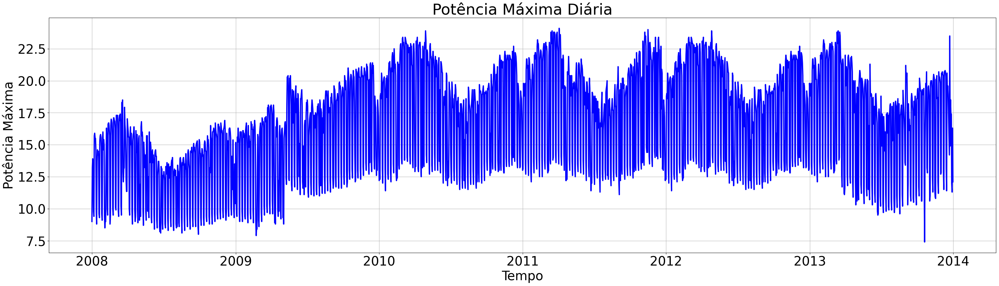

In [12]:
plt.figure(figsize=(40,10),dpi=100)
plt.rc('font', size=30)
plt.grid(True)
plt.plot(max_diaria,lw=3,color='b')
plt.xlabel('Tempo')
plt.ylabel('Potência Máxima')
plt.title('Potência Máxima Diária')

Text(0.5, 1.0, 'Potência Máxima Semanal')

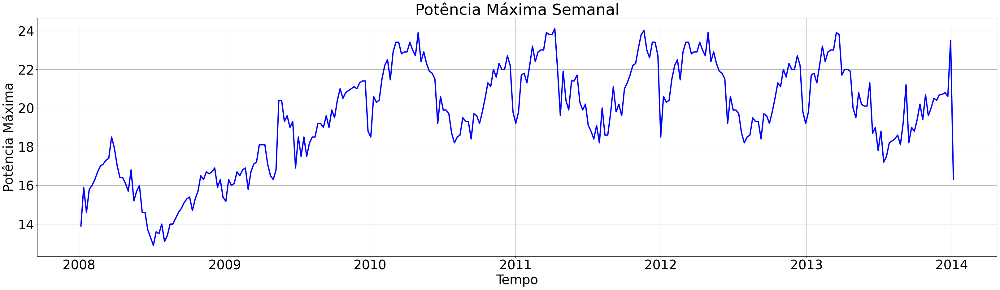

In [13]:
plt.figure(figsize=(40,10),dpi=100)
plt.rc('font', size=30)
plt.grid(True)
plt.plot(max_semanal,lw=3,color='b')
plt.xlabel('Tempo')
plt.ylabel('Potência Máxima')
plt.title('Potência Máxima Semanal')

## Média por dia da semana

In [14]:
data['weekday'] = [day.weekday() for day in data.index]
print(pd.unique(data.weekday))

[1 2 3 4 5 6 0]


In [15]:
data_weekday = data.groupby(by='weekday').mean()
data_weekday.index = ['Segunda-Feira','Terça-Feira','Quarta-Feira','Quinta-feira','Sexta-Feira','Sabado','Domingo']
data_weekday

,POTENCIA
Segunda-Feira,13.266084
Terça-Feira,13.339311
Quarta-Feira,13.471313
Quinta-feira,13.433887
Sexta-Feira,12.982430
Sabado,10.257191
Domingo,9.327263


Text(0.5, 1.0, 'Potência Média por Dia da Semana')

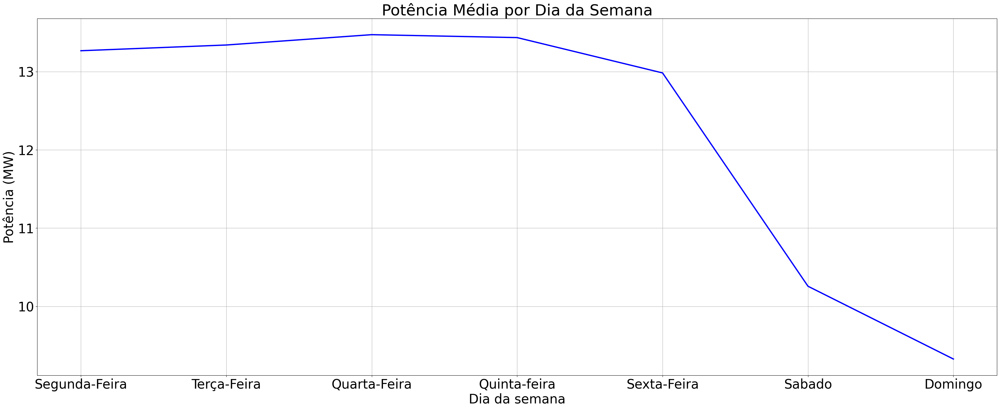

In [16]:
plt.figure(figsize=(40,15), dpi=100)
plt.rc('font', size=30)
plt.grid(True)
plt.plot(data_weekday, lw=3, color='b')
plt.xlabel('Dia da semana')
plt.ylabel('Potência (MW)')
plt.title('Potência Média por Dia da Semana')

## Perfil diário

### Todo o conjunto de dados

In [26]:
data['hour:minute'] = [f'{x.hour}:{x.minute}' for x in data.index]

perfil_horario = pd.DataFrame(index=pd.date_range(start ='2018-01-01 00:00:00',end ='2018-01-01 23:59:59', freq ='15min'))
_means = list()
_std = list()
_median = list()

for h in range(0, 24):
    for m in range(0,60,15):
        _means.append(data.groupby(by='hour:minute').get_group(f'{h}:{m}')['POTENCIA'].mean())
        _std.append(data.groupby(by='hour:minute').get_group(f'{h}:{m}')['POTENCIA'].std())
        _median.append(data.groupby(by='hour:minute').get_group(f'{h}:{m}')['POTENCIA'].median())

perfil_horario['POTENCIA_media'] = _means
perfil_horario['POTENCIA_desvio'] = _std
perfil_horario['POTENCIA_mediana'] = _median

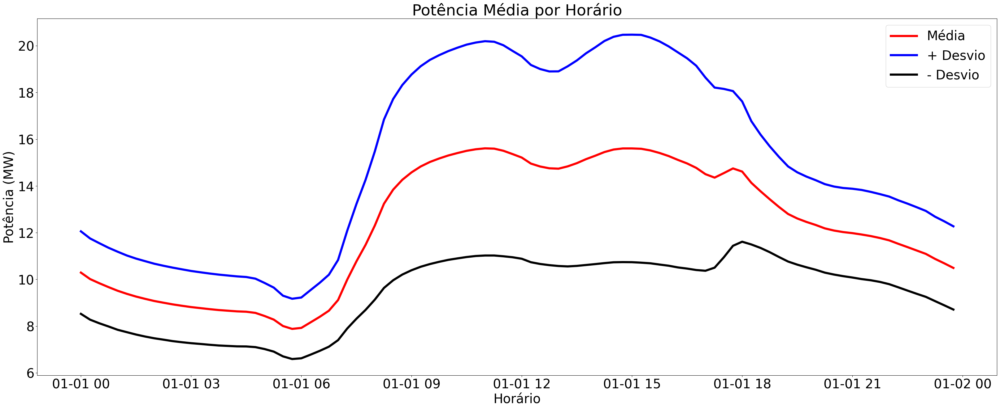

In [27]:
fig, ax = plt.subplots(1,1,figsize=(40,15), dpi=100)

ax.plot(perfil_horario[['POTENCIA_media']], lw=5, color='red', label='Média')
ax.plot(perfil_horario['POTENCIA_media'] + perfil_horario['POTENCIA_desvio'], lw=5, color='blue', label='+ Desvio')
ax.plot(perfil_horario['POTENCIA_media'] - perfil_horario['POTENCIA_desvio'], lw=5, color='black', label='- Desvio')
ax.set_xlabel('Horário')
ax.set_ylabel('Potência (MW)')
ax.set_title('Potência Média por Horário')
ax.legend()
ax.grid()

Text(0.5, 1.0, 'Potência Média por Horário')

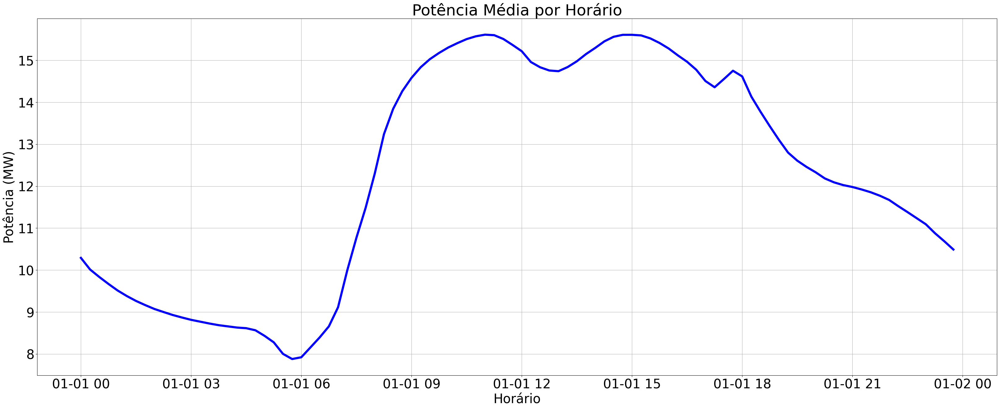

In [28]:
plt.figure(figsize=(40,15), dpi=100)
plt.rc('font', size=30)
plt.grid(True)
plt.plot(perfil_horario[['POTENCIA_media']], lw=5, color='b', label='Média')
plt.xlabel('Horário')
plt.ylabel('Potência (MW)')
plt.title('Potência Média por Horário')

### Por ano

In [29]:
print(data.index.max().year)
print(data.index.min().year)

2013
2008


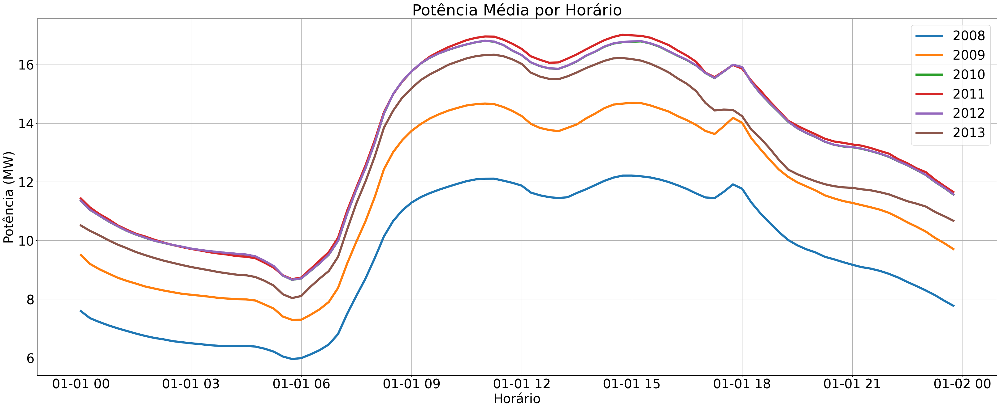

In [30]:
data['year'] = [x.year for x in data.index]
plt.figure(figsize=(40,15), dpi=100)
plt.rc('font', size=30)
plt.grid(True)
perfil_horario_por_ano = pd.DataFrame(index=pd.date_range(start ='2018-01-01 00:00:00',end ='2018-01-01 23:59:59', freq ='15min'))

for y in range(data.index.min().year, data.index.max().year+1):

    _aux = data.groupby(by='year').get_group(y)
    _means = list()

    for h in range(0, 24):
        for m in range(0,60,15):
            _means.append(_aux.groupby(by='hour:minute').get_group(f'{h}:{m}')['POTENCIA'].mean())

    perfil_horario_por_ano[f'POTENCIA_media_{y}'] = _means
    plt.plot(perfil_horario_por_ano[f'POTENCIA_media_{y}'], lw=5, label=f'{y}') # color='b',

plt.xlabel('Horário')
plt.ylabel('Potência (MW)')
plt.title('Potência Média por Horário')
plt.legend()

In [31]:
perfil_horario_por_ano.head()

,POTENCIA_media_2008,POTENCIA_media_2009,POTENCIA_media_2010,POTENCIA_media_2011,POTENCIA_media_2012,POTENCIA_media_2013
2018-01-01 00:00:00,7.592093,9.503147,11.355303,11.431796,11.359250,10.510732
2018-01-01 00:15:00,7.350596,9.200296,11.042038,11.123624,11.046841,10.327344
2018-01-01 00:30:00,7.222600,9.022254,10.847060,10.903945,10.851303,10.176423
2018-01-01 00:45:00,7.107050,8.875907,10.652439,10.725568,10.657214,10.010364
2018-01-01 01:00:00,7.006152,8.731974,10.483434,10.517602,10.487851,9.861017


### Por ano e dia da semana

In [32]:
data.columns

Index(['POTENCIA', 'weekday', 'hour:minute', 'year'], dtype='object')

In [33]:
perfil_horario_por_ano_por_dia_da_semana = pd.DataFrame(index=pd.date_range(start ='2018-01-01 00:00:00',end ='2018-01-01 23:59:59', freq ='15min'))

for y in range(data.index.min().year, data.index.max().year+1):

    _aux = data.groupby(by='year').get_group(y)

    for dia_da_semana in range(0,7):

        _means = list()
        _aux_weekday = _aux.groupby(by='weekday').get_group(dia_da_semana)

        for h in range(0, 24):
            for m in range(0,60,15):

                _means.append(_aux_weekday.groupby(by='hour:minute').get_group(f'{h}:{m}')['POTENCIA'].mean())

        perfil_horario_por_ano_por_dia_da_semana[ f'POTENCIA_media_{dia_da_semana}_{y}'] = _means

perfil_horario_por_ano_por_dia_da_semana.head()

,POTENCIA_media_0_2008,POTENCIA_media_1_2008,POTENCIA_media_2_2008,POTENCIA_media_3_2008,POTENCIA_media_4_2008,POTENCIA_media_5_2008,POTENCIA_media_6_2008,POTENCIA_media_0_2009,POTENCIA_media_1_2009,POTENCIA_media_2_2009,...,POTENCIA_media_4_2012,POTENCIA_media_5_2012,POTENCIA_media_6_2012,POTENCIA_media_0_2013,POTENCIA_media_1_2013,POTENCIA_media_2_2013,POTENCIA_media_3_2013,POTENCIA_media_4_2013,POTENCIA_media_5_2013,POTENCIA_media_6_2013
2018-01-01 00:00:00,7.285577,7.520755,7.616793,7.691253,7.693526,7.747500,7.590144,9.155769,9.476072,9.596875,...,11.544465,11.475437,11.156604,10.094231,10.725472,10.483030,10.768269,10.765429,10.556559,10.178005
2018-01-01 00:15:00,7.064717,7.276415,7.417359,7.407652,7.444708,7.473269,7.370192,8.928846,9.130026,9.268870,...,11.229456,11.174213,10.874528,9.921154,10.497666,10.307820,10.557632,10.552146,10.394747,10.056971
2018-01-01 00:30:00,6.974626,7.139623,7.256604,7.276456,7.329865,7.335577,7.246394,8.766346,8.947005,9.086058,...,11.037523,10.972989,10.718868,9.765385,10.336842,10.152801,10.384494,10.409056,10.248320,9.934976
2018-01-01 00:45:00,6.874919,7.002830,7.138679,7.189490,7.193867,7.220192,7.130769,8.629808,8.803767,8.960938,...,10.795591,10.799650,10.577358,9.623077,10.176018,9.968937,10.201741,10.214042,10.078816,9.806731
2018-01-01 01:00:00,6.763674,6.930189,7.029245,7.051562,7.110755,7.114423,7.044231,8.456731,8.660102,8.795433,...,10.628659,10.608042,10.424528,9.480769,9.998212,9.815841,10.008411,10.096913,9.943927,9.680409


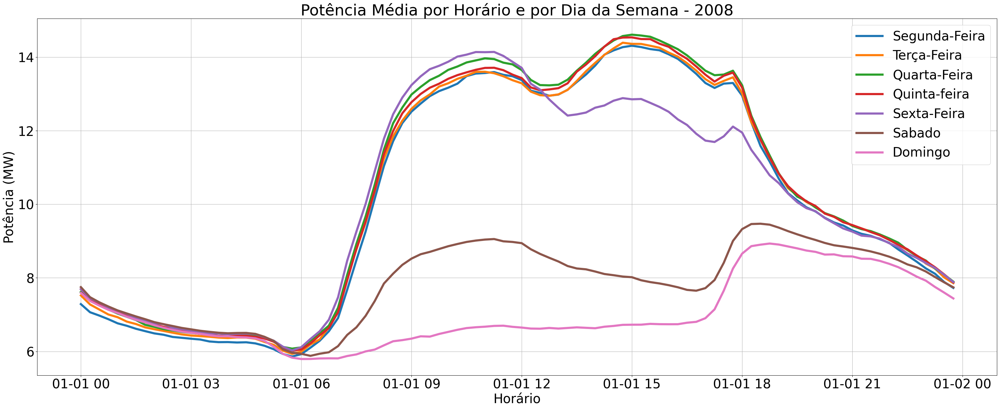

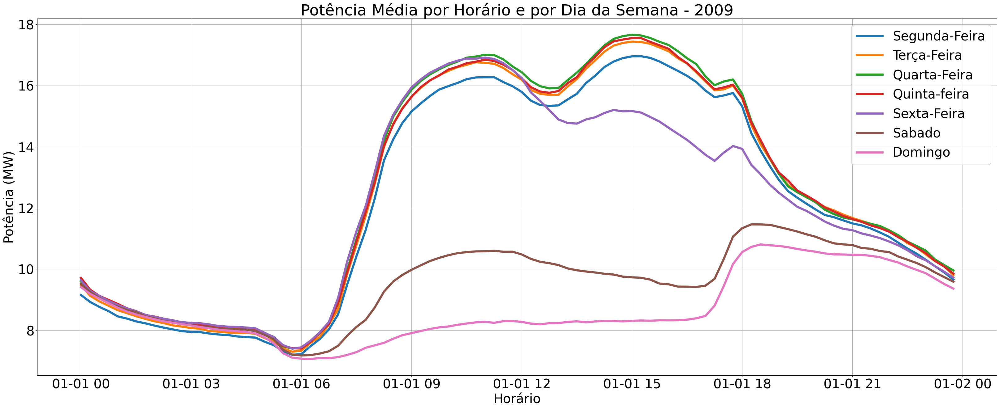

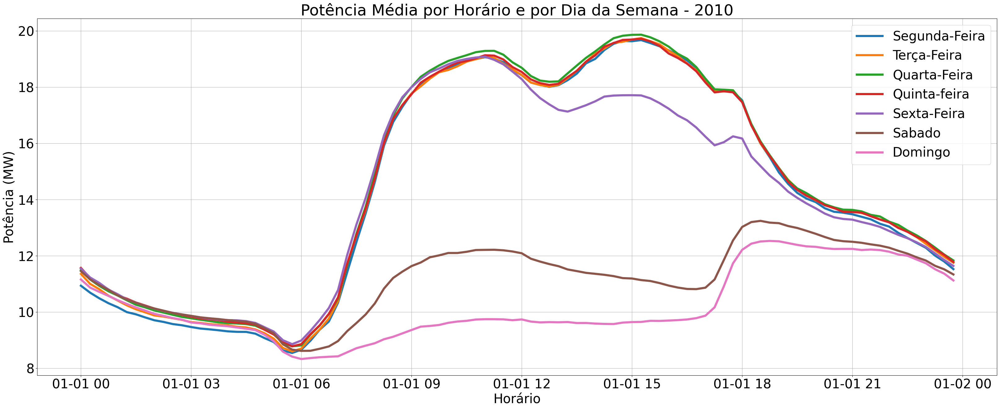

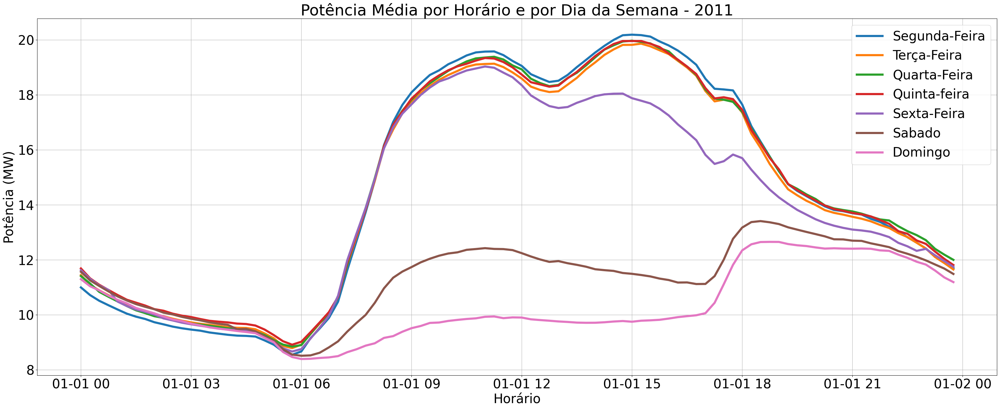

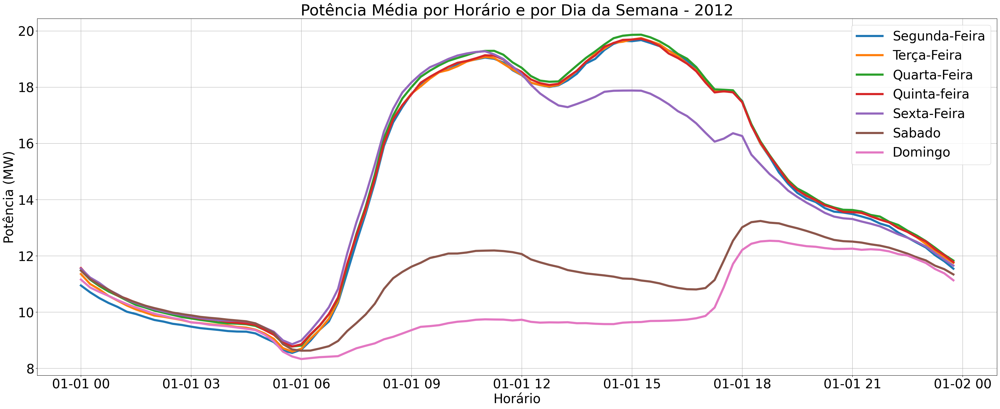

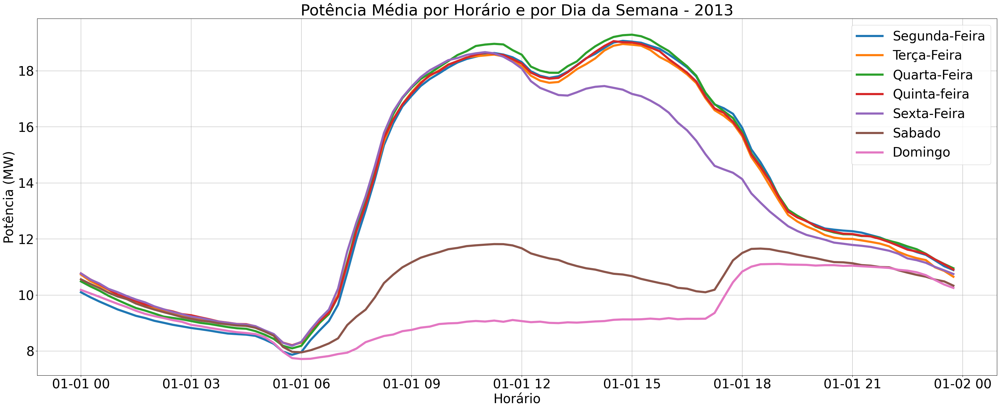

In [34]:
labels = ['Segunda-Feira','Terça-Feira','Quarta-Feira','Quinta-feira','Sexta-Feira','Sabado','Domingo']

for y in range(data.index.min().year, data.index.max().year+1):

    plt.figure(figsize=(40,15), dpi=100)

    for dia_da_semana in range(0,7):
        plt.plot(perfil_horario_por_ano_por_dia_da_semana[[f'POTENCIA_media_{dia_da_semana}_{y}']], lw=5, label=f'{labels[dia_da_semana]}')

    plt.rc('font', size=30)
    plt.grid(True)
    plt.xlabel('Horário')
    plt.ylabel('Potência (MW)')
    plt.title(f'Potência Média por Horário e por Dia da Semana - {y}')
    plt.legend()

## Criando o banco de dados para treinamento e teste da RNA

In [127]:
# data_semanal.reset_index(inplace=True)
data_semanal = pd.read_csv('/content/drive/MyDrive/9º COMP. OPTATIVA/Automação Inteligente 2023.2/dados_demanda_com_exemplos.csv', sep=';')
# data_semanal['day'] = data_semanal.TEMPO.map(lambda x: int(x[:2]))
data_semanal.TEMPO = data_semanal.TEMPO.apply(lambda x: datetime(day=int(x[:2]), month=int(x[3:5]), year=int(x[6:])))
# data_semanal['month'] = data_semanal.TEMPO.map(lambda x: x.month) # int(x[3:5])
data_semanal['week_number'] = data_semanal.TEMPO.map(lambda x: x.isocalendar().week)
data_semanal['mean_last_four_weeks'] = data_semanal[['POTENCIA(K-4)', 'POTENCIA(K-3)', 'POTENCIA(K-2)', 'POTENCIA(K-1)']].mean(axis=1)
data_semanal['mean_last_two_weeks'] = data_semanal[['POTENCIA(K-2)', 'POTENCIA(K-1)']].mean(axis=1)
data_semanal.drop(columns=['index','TEMPO'],inplace=True, errors='ignore')
data_semanal.head()

,POTENCIA(K-4),POTENCIA(K-3),POTENCIA(K-2),POTENCIA(K-1),POTENCIA,POTENCIA(K+1),POTENCIA(K+2),week_number,mean_last_four_weeks,mean_last_two_weeks
0,13.9,15.900000,14.600000,15.800000,16.000000,16.299999,16.700001,5,15.050,15.20
1,15.9,14.600000,15.800000,16.000000,16.299999,16.700001,17.000000,6,15.575,15.90
2,14.6,15.800000,16.000000,16.299999,16.700001,17.000000,17.100000,7,15.675,16.15
3,15.8,16.000000,16.299999,16.700001,17.000000,17.100000,17.299999,8,16.200,16.50
4,16.0,16.299999,16.700001,17.000000,17.100000,17.299999,17.400000,9,16.500,16.85


#### Correlação dos dados de entrada com os dados de saída

In [50]:
import seaborn as sns

In [128]:
corr_k1 = np.abs(data_semanal.corr().filter(items=['POTENCIA(K+1)']).dropna()).T.drop(columns=['POTENCIA(K+1)']).sort_values(axis=1,by='POTENCIA(K+1)',ascending=False)
corr_k2 = np.abs(data_semanal.corr().filter(items=['POTENCIA(K+2)']).dropna()).T.drop(columns=['POTENCIA(K+2)']).sort_values(axis=1,by='POTENCIA(K+2)',ascending=False)
corr_k1.loc[:,corr_k1.columns[:10]]

,POTENCIA,POTENCIA(K+2),POTENCIA(K-1),mean_last_two_weeks,mean_last_four_weeks,POTENCIA(K-2),POTENCIA(K-3),POTENCIA(K-4),week_number
POTENCIA(K+1),0.936195,0.923649,0.903429,0.902614,0.886861,0.873995,0.846929,0.812574,0.110708


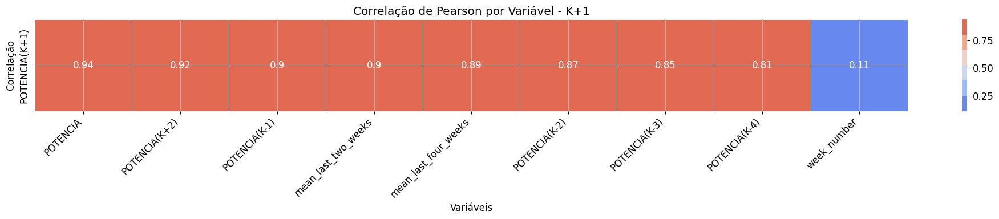

In [135]:
f, ax = plt.subplots(figsize=(20,4))

my_plot = sns.heatmap(
    corr_k1,
    # pd.DataFrame(corr_k1['POTENCIA(K+1)'].filter(items=corr_k1.columns)).T,
    cmap=sns.color_palette("coolwarm"),
    linewidths=0.5,
    annot=True
)

my_plot.set_xticklabels(my_plot.get_xticklabels(), rotation=45)

#modify individual font size of elements
plt.tick_params(axis='both', which='major', labelsize=12)
plt.xlabel('Variáveis')
plt.ylabel('Correlação')
plt.title('Correlação de Pearson por Variável - K+1')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

#### Divisão dos dados de treinamento e teste

In [54]:
# data_semanal_aux = data_semanal #.to_numpy()
# # data_semanal_aux = tf.keras.utils.normalize(data_semanal_aux, axis=1)

# x_train = data_semanal_aux.loc[0:216,['POTENCIA(K-4)', 'POTENCIA(K-3)', 'POTENCIA(K-2)', 'POTENCIA(K-1)','POTENCIA',]] # [0:216,0:5]
# y_train = data_semanal_aux.loc[0:216,['POTENCIA(K+1)', 'POTENCIA(K+2)']] # [0:216,5:7]
# x_train_scaled, x_scalers = scale_data(x_train, scaler_type='minmax')
# y_train_scaled, y_scalers = scale_data(y_train, scaler_type='minmax')

# x_test = data_semanal_aux.loc[216:308,['POTENCIA(K-4)', 'POTENCIA(K-3)', 'POTENCIA(K-2)', 'POTENCIA(K-1)','POTENCIA']]# [216:308,0:5]
# y_test = data_semanal_aux.loc[216:308,['POTENCIA(K+1)', 'POTENCIA(K+2)']] # [216:308,5:7]
# x_test_scaled = scale_data(x_test, x_scalers)
# y_test_scaled = scale_data(y_test, y_scalers)

In [137]:
data_semanal_aux = data_semanal
x_train, x_test, y_train, y_test = train_test_split(
    data_semanal_aux[['POTENCIA(K-4)', 'POTENCIA(K-3)', 'POTENCIA(K-2)', 'POTENCIA(K-1)','POTENCIA', 'mean_last_four_weeks', 'mean_last_two_weeks']],
    data_semanal_aux[['POTENCIA(K+1)', 'POTENCIA(K+2)']],
    test_size=0.2,
    random_state=42,
    shuffle=True
)

x_train_scaled, x_scalers = scale_data(x_train, scaler_type='minmax')
y_train_scaled, y_scalers = scale_data(y_train, scaler_type='minmax')

x_test_scaled = scale_data(x_test, x_scalers)
y_test_scaled = scale_data(y_test, y_scalers)

In [138]:
print(f'Shape x_train: {x_train.shape}')
print(f'Shape y_train: {y_train.shape}')
print(f'Shape x_test: {x_test.shape}')
print(f'Shape y_test: {y_test.shape}')

Shape x_train: (246, 7)
Shape y_train: (246, 2)
Shape x_test: (62, 7)
Shape y_test: (62, 2)


## Modelo

In [139]:
tf.keras.backend.clear_session()
model = tf.keras.models.Sequential(name='MLP')

model.add(tf.keras.layers.Input(7, name='Input_Layer'))
model.add(tf.keras.layers.Dense(20, activation=tf.nn.sigmoid, name='Hidden_Layer_1'))
model.add(tf.keras.layers.Dense(20, activation=tf.nn.sigmoid, name='Hidden_Layer_2'))
model.add(tf.keras.layers.Dense(2, activation=tf.nn.sigmoid, name='Output_Layer'))

model.compile(
    optimizer='adam',
    loss='mse',
    metrics=['mae','mse', tf.keras.metrics.RootMeanSquaredError(name='rmse')]
)

model.summary()

Model: "MLP"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Hidden_Layer_1 (Dense)      (None, 20)                160       
                                                                 
 Hidden_Layer_2 (Dense)      (None, 20)                420       
                                                                 
 Output_Layer (Dense)        (None, 2)                 42        
                                                                 
Total params: 622 (2.43 KB)
Trainable params: 622 (2.43 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [140]:
history = model.fit(
    x=x_train_scaled,
    y=y_train_scaled,
    epochs=500,
    # callbacks=[
    #     tf.keras.callbacks.EarlyStopping(
    #         monitor='mse',
    #         min_delta=1e-9,
    #         patience=30
    #     )
    # ]
)

Epoch 1/500
8/8 [==============================] - 1s 2ms/step - loss: 0.0885 - mae: 0.2440 - mse: 0.0885 - rmse: 0.2974
Epoch 2/500
8/8 [==============================] - 0s 2ms/step - loss: 0.0745 - mae: 0.2248 - mse: 0.0745 - rmse: 0.2730
Epoch 3/500
8/8 [==============================] - 0s 2ms/step - loss: 0.0618 - mae: 0.2049 - mse: 0.0618 - rmse: 0.2486
Epoch 4/500
8/8 [==============================] - 0s 2ms/step - loss: 0.0506 - mae: 0.1862 - mse: 0.0506 - rmse: 0.2249
Epoch 5/500
8/8 [==============================] - 0s 2ms/step - loss: 0.0418 - mae: 0.1703 - mse: 0.0418 - rmse: 0.2045
Epoch 6/500
8/8 [==============================] - 0s 2ms/step - loss: 0.0353 - mae: 0.1576 - mse: 0.0353 - rmse: 0.1878
Epoch 7/500
8/8 [==============================] - 0s 2ms/step - loss: 0.0307 - mae: 0.1469 - mse: 0.0307 - rmse: 0.1752
Epoch 8/500
8/8 [==============================] - 0s 2ms/step - loss: 0.0280 - mae: 0.1394 - mse: 0.0280 - rmse: 0.1675
Epoch 9/500
8/8 [===============

In [142]:
history = pd.DataFrame(history.history)
history.head()

,loss,mae,mse,rmse
0,0.088461,0.244016,0.088461,0.297424
1,0.074540,0.224765,0.074540,0.273020
2,0.061801,0.204864,0.061801,0.248599
3,0.050596,0.186189,0.050596,0.224936
4,0.041818,0.170334,0.041818,0.204493


Text(0.5, 0, 'Epoch')

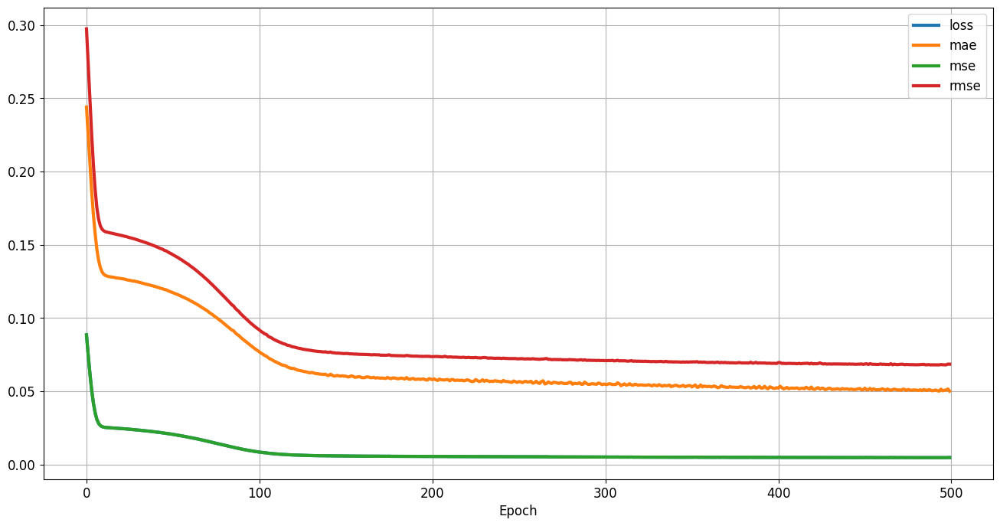

In [143]:
fig, ax = plt.subplots(1,1,figsize=(16,8))
for col in history.columns:
    ax.plot(history[col], lw=3, label=col)
ax.legend()
plt.grid(True)
plt.xlabel('Epoch')
# plt.ylabel('Potência (MW)')
# plt.title('Potência Média por Horário')

### Avaliação do conjunto de teste

In [141]:
for name, metric in zip(['loss','mae','mse'],model.evaluate(x_test_scaled,y_test_scaled)): print(f'{name}:{metric}')

2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - mae: 0.0385 - mse: 0.0025 - rmse: 0.0501
loss:0.0025140168145298958
mae:0.038533344864845276
mse:0.0025140168145298958


In [144]:
df_real_previsto = y_test # pd.DataFrame()
# df_real_previsto['real K+1'] = y_test[:,0]
# df_real_previsto['real K+2'] = y_test[:,1]
df_real_previsto.reset_index(inplace=True)
df_real_previsto.drop(columns=['index','level_0'], inplace=True, errors='ignore')
df_real_previsto.head()

,POTENCIA(K+1),POTENCIA(K+2)
0,18.6,18.100000
1,16.4,16.400000
2,17.1,17.200001
3,18.1,18.100000
4,13.1,13.400000


In [145]:
y_predicted = model.predict(x_test_scaled)
y_predicted.shape

2/2 [==============================] - 0s 5ms/step


(62, 2)

In [146]:
df_real_previsto['previsto K+1'] = y_scalers['POTENCIA(K+1)'].inverse_transform(y_predicted[:,0].reshape(-1, 1))
df_real_previsto['previsto K+2'] = y_scalers['POTENCIA(K+2)'].inverse_transform(y_predicted[:,1].reshape(-1, 1))

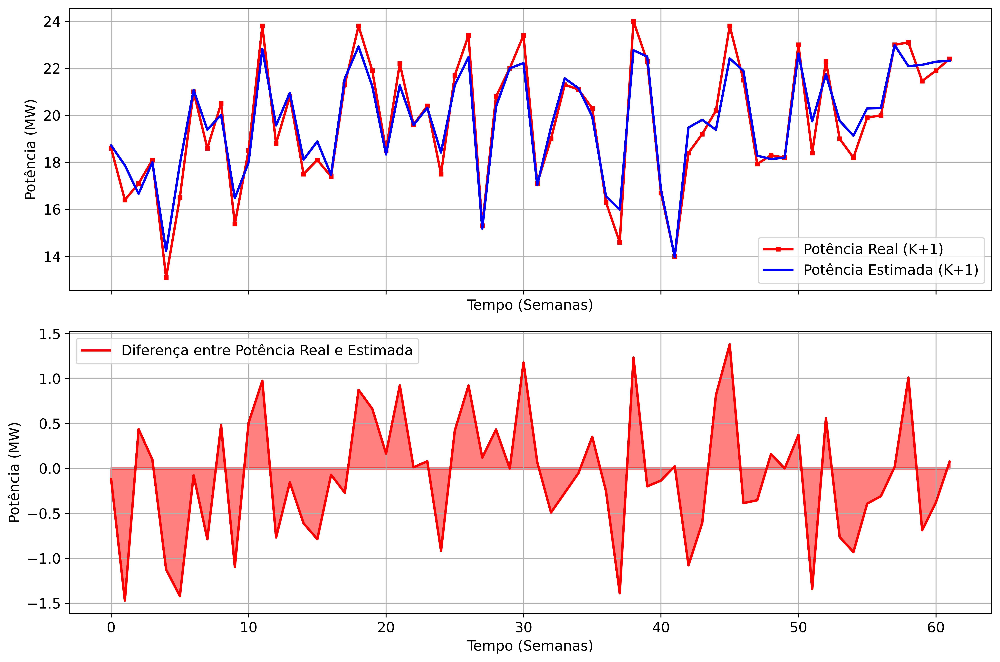

In [147]:
difference_plot(
    real_data=df_real_previsto['POTENCIA(K+1)'],
    predicted_data=df_real_previsto['previsto K+1'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+1)','Potência Estimada (K+1)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./difference_plot.png',
    save=False,
    formats=['png'],
    return_fig=False
)

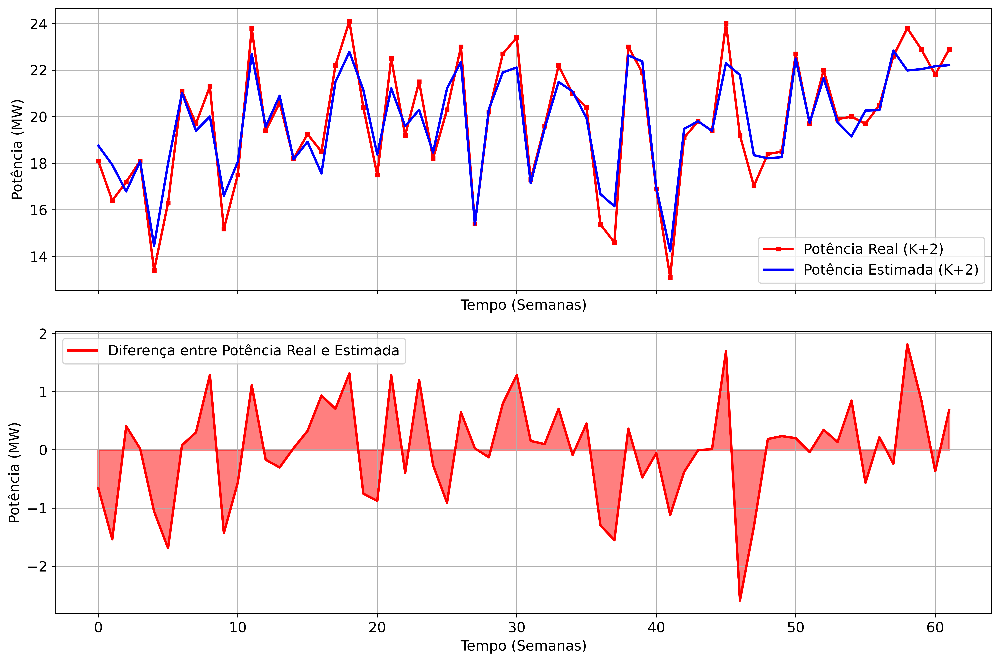

In [148]:
difference_plot(
    real_data=df_real_previsto['POTENCIA(K+2)'],
    predicted_data=df_real_previsto['previsto K+2'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+2)','Potência Estimada (K+2)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./difference_plot.png',
    save=False,
    formats=['png'],
    return_fig=False
)

### Métricas de avaliação

#### K+1

In [149]:
print(f"MAE: {mean_absolute_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1'])}")
print(f"MSE: {mean_squared_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1'])}")
print(f"RMSE: {np.sqrt(mean_squared_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1']))}")
print(f"MAXE: {max_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1'])}")
print(f"MAPE: {mean_absolute_percentage_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1'])*100}")
print(f"Max_APE: {max_absolute_percentage_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1'])*100}")

MAE: 0.5496887099615676
MSE: 0.48741904374407274
RMSE: 0.6981540258023817
MAXE: 1.4709644302929696
MAPE: 2.873087231109783
Max_APE: 9.521810738031952


#### K+2

In [183]:
print(f"MAE: {mean_absolute_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2'])}")
print(f"MSE: {mean_squared_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2'])}")
print(f"RMSE: {np.sqrt(mean_squared_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2']))}")
print(f"MAXE: {max_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2'])}")
print(f"MAPE: {mean_absolute_percentage_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2'])*100}")
print(f"Max_APE: {max_absolute_percentage_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2'])*100}")

MAE: 0.6711750047771625
MSE: 0.771449468764055
RMSE: 0.8783219619046623
MAXE: 2.5912971525976545
MAPE: 3.5126727752668807
Max_APE: 13.496338802216037


## RandomSearch com o KerasTuner

In [155]:
def build_MLP_model(hp, input_shape=(7)):

    model = tf.keras.Sequential(name='MLP_Model')
    # model.add(layers.Dense(units=hp.Int('units', min_value=10, max_value=256, step=8), activation='relu', input_shape=(input_shape,)))
    model.add(
        tf.keras.layers.Dense(
            units = hp.Int('units', min_value=1, max_value=100, step=1),
            activation = hp.Choice('activation', values=['relu','sigmoid']),
            # activation = 'sigmoid',
            input_shape=(input_shape,)
        )
    )

    # Number of layers of the MLP is a hyperparameter.
    for i in range(hp.Int("mlp_layers", 1, 3)):
        # Number of units of each layer are different hyperparameters with different names.
        #model.add(layers.Dense(units=hp.Int(f"units_{i}", min_value=10, max_value=256, step=8), activation='relu'))
        model.add(
            tf.keras.layers.Dense(
                units=hp.Int(f"units_{i}", min_value=1, max_value=100, step=1),
                activation = hp.Choice('activation', values=['relu','sigmoid'])
                # activation = 'sigmoid'
            )
        )

    model.add(tf.keras.layers.Dense(units=2, activation = 'sigmoid'))

    model.compile(
        optimizer=tf.keras.optimizers.Adam(
            learning_rate= hp.Float("lr", min_value=1e-6, max_value=1e-1, sampling="log")
        ),
        loss='mse',
        metrics=[
            'mae',
            'mse',
            tf.keras.metrics.RootMeanSquaredError(name='root_mean_squared_error'),
            tf.keras.losses.MeanAbsolutePercentageError(reduction="auto", name='mean_absolute_percentage_error')
        ]
    )

    return model

In [156]:
!rm -rf results

In [157]:
tuner = RandomSearch(
    build_MLP_model,
    objective=Objective("mse", direction="min"),
    max_trials=30,
    executions_per_trial=2,
    directory='./results',
    project_name='mlp'
)

In [158]:
tuner.search_space_summary()

Search space summary
Default search space size: 5
units (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 100, 'step': 1, 'sampling': 'linear'}
activation (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'sigmoid'], 'ordered': False}
mlp_layers (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 3, 'step': 1, 'sampling': 'linear'}
units_0 (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 100, 'step': 1, 'sampling': 'linear'}
lr (Float)
{'default': 1e-06, 'conditions': [], 'min_value': 1e-06, 'max_value': 0.1, 'step': None, 'sampling': 'log'}


In [159]:
tuner.search(
    x_train_scaled,
    y_train_scaled,
    epochs=200,
    # batch_size=20,
    # validation_data=(x_valid_scaled, y_valid_scaled)
)

Trial 30 Complete [00h 00m 17s]
mse: 0.04295150190591812

Best mse So Far: 0.004059122409671545
Total elapsed time: 00h 09m 36s


In [160]:
models = tuner.get_best_models(3)
tuner.results_summary(3)

Results summary
Results in ./results/mlp
Showing 3 best trials
Objective(name="mse", direction="min")

Trial 15 summary
Hyperparameters:
units: 63
activation: relu
mlp_layers: 1
units_0: 56
lr: 0.019395556611655537
units_1: 43
units_2: 95
Score: 0.004059122409671545

Trial 17 summary
Hyperparameters:
units: 90
activation: relu
mlp_layers: 1
units_0: 95
lr: 0.002124182652188752
units_1: 69
units_2: 37
Score: 0.0042046725284308195

Trial 14 summary
Hyperparameters:
units: 41
activation: sigmoid
mlp_layers: 2
units_0: 52
lr: 0.08819543663083977
units_1: 20
units_2: 88
Score: 0.0042275055311620235


In [161]:
best_model = models[0]
# Build the model.
# Needed for `Sequential` without specified `input_shape`.
best_model.build(input_shape=x_train_scaled.shape[1])
best_model.summary()

Model: "MLP_Model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 63)                504       
                                                                 
 dense_1 (Dense)             (None, 56)                3584      
                                                                 
 dense_2 (Dense)             (None, 2)                 114       
                                                                 
Total params: 4202 (16.41 KB)
Trainable params: 4202 (16.41 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


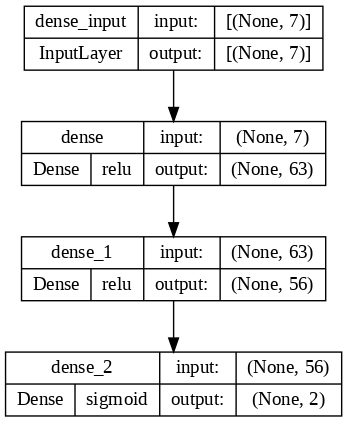

In [162]:
tf.keras.utils.plot_model(
    best_model,
    "./results/mlp/best_model_TB.png",
    show_shapes=True,
    rankdir="TB", # a string specifying the format of the plot: 'TB' creates a vertical plot; 'LR' creates a horizontal plot.
    dpi=100,
    show_layer_activations=True,
)

### Retreinando o melhor modelo

In [179]:
# Get the top 2 hyperparameters.
tf.keras.backend.clear_session()
best_hps = tuner.get_best_hyperparameters(5)
# Build the model_tuner with the best hp.
model_tuner = build_MLP_model(best_hps[1])

history = model_tuner.fit(
    x_train_scaled,
    y_train_scaled,
    epochs=500,
    # batch_size=20,
    # validation_data=(x_valid_scaled,y_valid_scaled),
    # callbacks=[tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10, min_delta=0.000001)]
)

test_scores = model_tuner.evaluate(
    x=x_test_scaled,
    y=y_test_scaled,
    verbose=0
)

print("Test loss:", test_scores[0])
print("Test accuracy:", test_scores[1])

Epoch 1/500
8/8 [==============================] - 1s 3ms/step - loss: 0.0274 - mae: 0.1357 - mse: 0.0274 - root_mean_squared_error: 0.1656 - mean_absolute_percentage_error: 28.3587
Epoch 2/500
8/8 [==============================] - 0s 2ms/step - loss: 0.0205 - mae: 0.1153 - mse: 0.0205 - root_mean_squared_error: 0.1433 - mean_absolute_percentage_error: 27.8419
Epoch 3/500
8/8 [==============================] - 0s 2ms/step - loss: 0.0191 - mae: 0.1127 - mse: 0.0191 - root_mean_squared_error: 0.1383 - mean_absolute_percentage_error: 26.5168
Epoch 4/500
8/8 [==============================] - 0s 2ms/step - loss: 0.0178 - mae: 0.1093 - mse: 0.0178 - root_mean_squared_error: 0.1333 - mean_absolute_percentage_error: 25.4444
Epoch 5/500
8/8 [==============================] - 0s 2ms/step - loss: 0.0162 - mae: 0.1047 - mse: 0.0162 - root_mean_squared_error: 0.1274 - mean_absolute_percentage_error: 24.1066
Epoch 6/500
8/8 [==============================] - 0s 2ms/step - loss: 0.0143 - mae: 0.098

In [180]:
history = pd.DataFrame(history.history)
history.head()

,loss,mae,mse,root_mean_squared_error,mean_absolute_percentage_error
0,0.027408,0.135692,0.027408,0.165554,28.358711
1,0.020539,0.115259,0.020539,0.143313,27.841862
2,0.019123,0.112688,0.019123,0.138287,26.516850
3,0.017777,0.109308,0.017777,0.133331,25.444372
4,0.016226,0.104696,0.016226,0.127381,24.106573


Text(0.5, 0, 'Epoch')

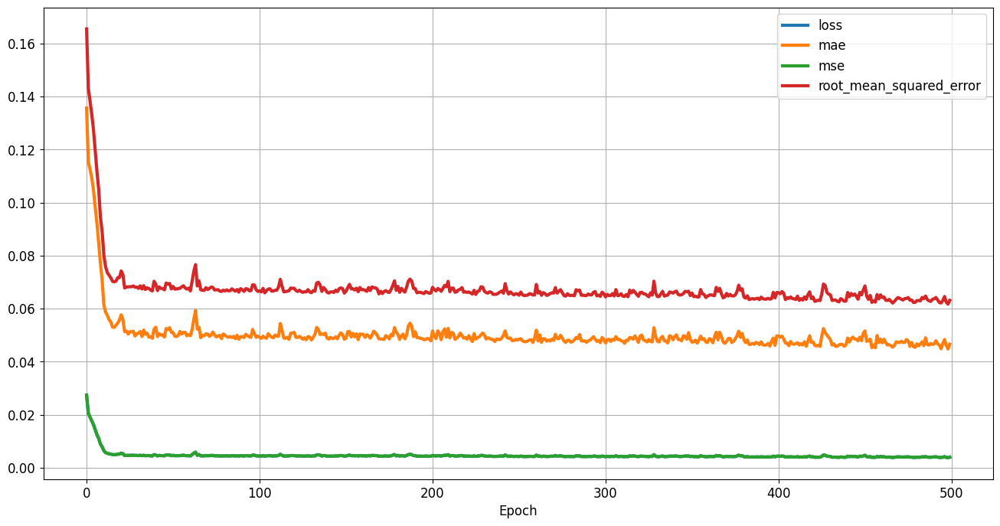

In [181]:
fig, ax = plt.subplots(1,1,figsize=(16,8))
for col in history.columns[:-1]:
    ax.plot(history[col], lw=3, label=col)
ax.legend()
plt.grid(True)
plt.xlabel('Epoch')
# plt.ylabel('Potência (MW)')
# plt.title('Potência Média por Horário')

### Avaliação do conjunto de teste

In [184]:
for name, metric in zip(['loss','mae','mse'],model_tuner.evaluate(x_test_scaled,y_test_scaled)): print(f'{name}:{metric}')

2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - mae: 0.0383 - mse: 0.0023 - root_mean_squared_error: 0.0478 - mean_absolute_percentage_error: 7.7943
loss:0.0022814441472291946
mae:0.038326676934957504
mse:0.0022814441472291946


In [185]:
# df_real_previsto = y_test # pd.DataFrame()
# df_real_previsto['real K+1'] = y_test[:,0]
# df_real_previsto['real K+2'] = y_test[:,1]
# df_real_previsto.reset_index(inplace=True)
# df_real_previsto.drop(columns=['index','level_0'], inplace=True, errors='ignore')
df_real_previsto.head()

,POTENCIA(K+1),POTENCIA(K+2),previsto K+1,previsto K+2,previsto K+1 - RandomSearch,previsto K+2 - RandomSearch
0,18.6,18.100000,18.719004,18.760086,18.354494,18.082317
1,16.4,16.400000,17.870964,17.937851,17.249454,17.187061
2,17.1,17.200001,16.662363,16.792484,16.587751,16.790987
3,18.1,18.100000,18.001644,18.080278,17.784786,17.364389
4,13.1,13.400000,14.224337,14.459863,14.949124,14.934766


In [186]:
y_predicted = model_tuner.predict(x_test_scaled)
y_predicted.shape

2/2 [==============================] - 0s 7ms/step


(62, 2)

In [187]:
df_real_previsto['previsto K+1 - RandomSearch'] = y_scalers['POTENCIA(K+1)'].inverse_transform(y_predicted[:,0].reshape(-1, 1))
df_real_previsto['previsto K+2 - RandomSearch'] = y_scalers['POTENCIA(K+2)'].inverse_transform(y_predicted[:,1].reshape(-1, 1))

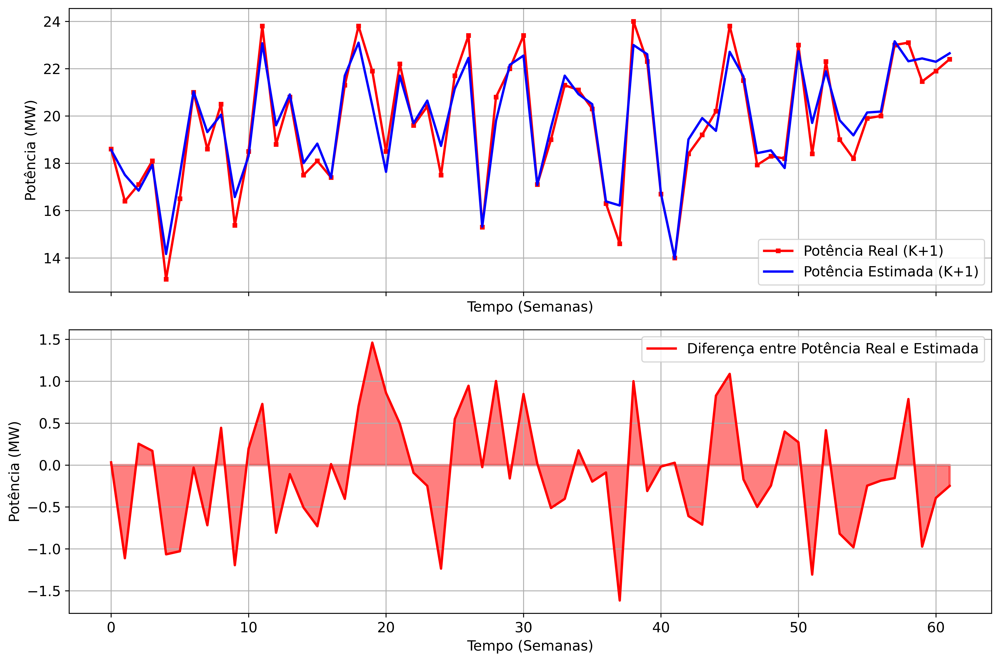

In [188]:
difference_plot(
    real_data=df_real_previsto['POTENCIA(K+1)'],
    predicted_data=df_real_previsto['previsto K+1 - RandomSearch'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+1)','Potência Estimada (K+1)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./difference_plot.png',
    save=False,
    formats=['png'],
    return_fig=False
)

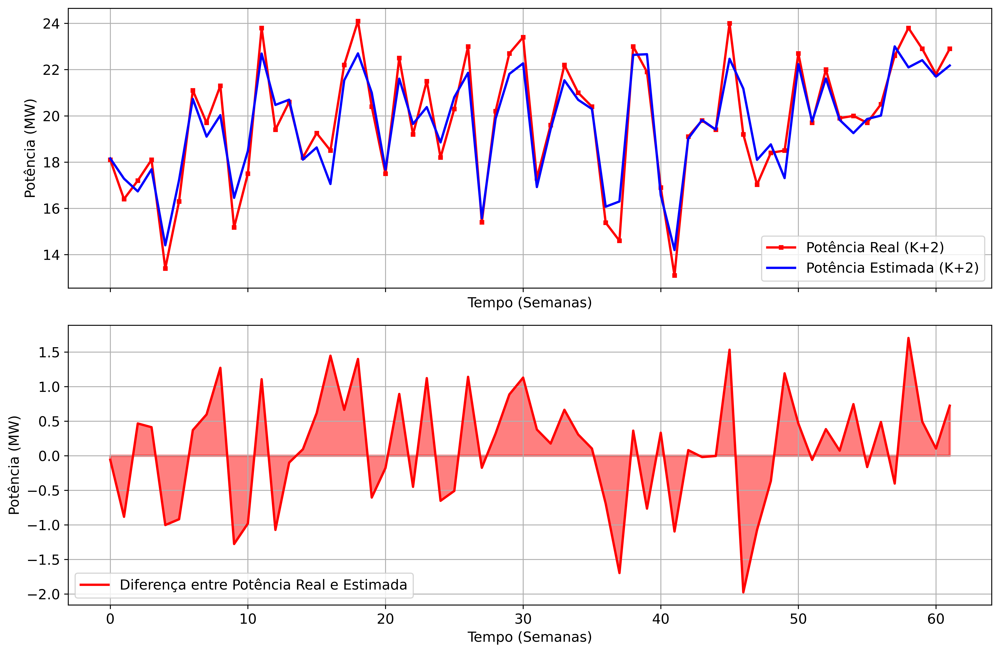

In [189]:
difference_plot(
    real_data=df_real_previsto['POTENCIA(K+2)'],
    predicted_data=df_real_previsto['previsto K+2 - RandomSearch'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+2)','Potência Estimada (K+2)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./difference_plot.png',
    save=False,
    formats=['png'],
    return_fig=False
)

### Métricas de avaliação

#### K+1

In [190]:
print(f"MAE: {mean_absolute_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 - RandomSearch'])}")
print(f"MSE: {mean_squared_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 - RandomSearch'])}")
print(f"RMSE: {np.sqrt(mean_squared_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 - RandomSearch']))}")
print(f"MAXE: {max_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 - RandomSearch'])}")
print(f"MAPE: {mean_absolute_percentage_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 - RandomSearch'])*100}")
print(f"Max_APE: {max_absolute_percentage_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 - RandomSearch'])*100}")

MAE: 0.5462133205278557
MSE: 0.4669604608985467
RMSE: 0.6833450525895002
MAXE: 1.6157665267382804
MAPE: 2.8541652505470383
Max_APE: 11.066893730712906


#### K+2

In [191]:
print(f"MAE: {mean_absolute_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 - RandomSearch'])}")
print(f"MSE: {mean_squared_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 - RandomSearch'])}")
print(f"RMSE: {np.sqrt(mean_squared_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 - RandomSearch']))}")
print(f"MAXE: {max_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 - RandomSearch'])}")
print(f"MAPE: {mean_absolute_percentage_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 - RandomSearch'])*100}")
print(f"Max_APE: {max_absolute_percentage_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 - RandomSearch'])*100}")

MAE: 0.6680930676448698
MSE: 0.6763216415681533
RMSE: 0.8223877683721672
MAXE: 1.9760246306249982
MAPE: 3.471883128311463
Max_APE: 11.066893730712906
